##**Importing the necessary libraries**

In [ ]:
#library used used for cleaning, exploring and manipulating data
import pandas as pd

#used to make statistical graphs
import seaborn as sb

#used for working with arrays
import numpy as np

#collection of functions used to manipulate graphs
import matplotlib.pyplot as plt

#library that provides visualizations to understand the presence and distribution of missing data within a dataframe
import missingno as mn

#along with the features of plotly, it allows you to interact with the data, select only a part, to zoom any part, and for great visualizations
import plotly.express as pex

#a scikit-learn class used to fill out the missing values in a dataset
from sklearn.impute import KNNImputer

#to disable warnings 
import warnings
warnings.filterwarnings('ignore')

##**Reading csv file**

In [ ]:
link = "https://github.com/AminRane/AQI/blob/main/city_day.csv?raw=true"
df = pd.read_csv(link)
df

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


In [ ]:
#to print datatype, columns, non null values, memory usage
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        29531 non-null  object 
 1   Date        29531 non-null  object 
 2   PM2.5       24885 non-null  float64
 3   PM10        18348 non-null  float64
 4   NO          25947 non-null  float64
 5   NO2         25940 non-null  float64
 6   NOx         25342 non-null  float64
 7   NH3         19197 non-null  float64
 8   CO          27469 non-null  float64
 9   SO2         25674 non-null  float64
 10  O3          25509 non-null  float64
 11  Benzene     23908 non-null  float64
 12  Toluene     21490 non-null  float64
 13  Xylene      11422 non-null  float64
 14  AQI         24850 non-null  float64
 15  AQI_Bucket  24850 non-null  object 
dtypes: float64(13), object(3)
memory usage: 3.6+ MB


In [ ]:
#shows the names of column labels
df.columns

Index(['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'],
      dtype='object')

In [ ]:
#generates descriptive statistics --> central tendencies, dispersion, and shape of dataset's distribution, excluding NaN values
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24885.000000,18348.000000,25947.000000,25940.000000,25342.000000,19197.000000,27469.000000,25674.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.322366,117.869218,17.571029,28.552253,32.301177,23.475130,2.248332,14.531757,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.558576,90.313591,22.779944,24.469797,31.640184,25.682661,6.963033,18.134706,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.780000,56.200000,5.630000,11.750000,12.820000,8.570000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.490000,95.610000,9.890000,21.685000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.450000,149.415000,19.945000,37.600000,40.117500,30.010000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [ ]:
#using the missingno library to create a matrix
#matrix is good for time series data
def createNullMatrix(city, columns = None):
    if columns is None: 
        mn.matrix(city)
    elif columns.lower() == 'pollutants':
        mn.matrix(city[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3']])

**Plotting an AQI for getting the outliers**

In [ ]:
#plotting a boxplot to find the outliers in the original values of AQI
#fig = pex.box(df['AQI'].astype(float))
fig = pex.box(df[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3', 'AQI']])
fig.show()

**Creating a null matrix to check the distribution of missing values**

In [ ]:
#axis = 1 to delete entire columns
df = df.drop(['AQI', 'AQI_Bucket'], axis=1)

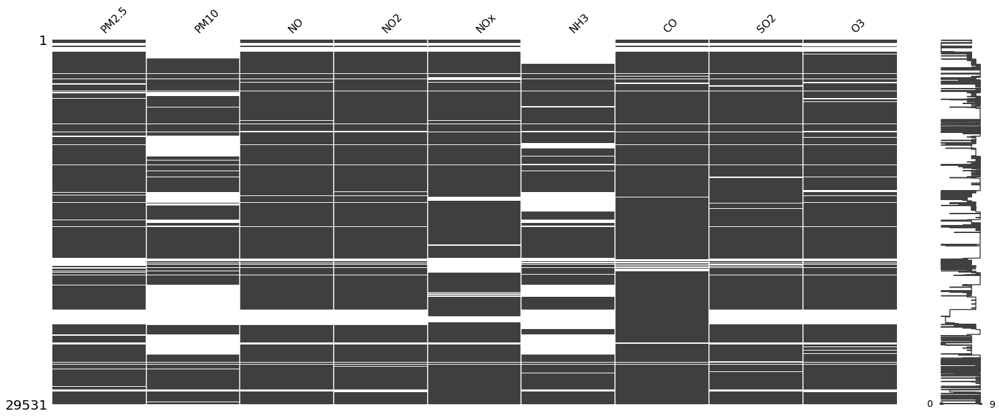

In [ ]:
#creating a matrix of null values to show the presence of null values in the data
createNullMatrix(df, columns = 'pollutants')

#**Imputing the missing values using KNNImputer**

In [ ]:
#knn_imputer imputes the values keeping number of neighbours as 20, the value of metric is set nan_euclidean by default - as the data has same units
knn_imputer = KNNImputer(n_neighbors = 20)
#creating a list for the values which we want to impute
imputing_cols = [ 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3']
#knn_imputer.fit(): applied to a dataset to create a copy of the dataset with all missing values for each column replaced with an estimated value
knn_imputer.fit(df[imputing_cols])
#fit to the data, and then, transform it
imputed = knn_imputer.transform(df[imputing_cols])
#access all the columns using df.loc[ : --> rows, imputing_cols --> the columns]: fill the values with the imputed ones
df.loc[:, imputing_cols] = imputed

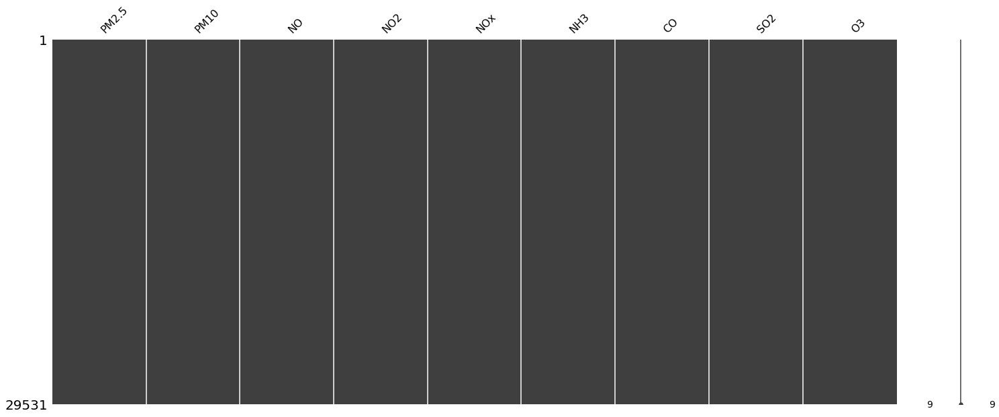

In [ ]:
#creating a null matrix after imputing the values --> no value is null
createNullMatrix(df, columns = 'pollutants')

In [ ]:
#function to get subindex of PM2.5
def get_PM25_subindex(x):
    if 0 <= x <= 30:
        return (50 / 30) * x
    elif x <= 60:
        return ((100-51) / (60-31)) * (x - 31) + 51
    elif x <= 90:
        return ((200-101) / (90-61)) * (x - 61) + 101
    elif x <= 120:
        return ((300-201) / (120-91)) * (x - 91) + 201
    elif x <= 250:
        return ((400-301) / (250-121)) * (x - 121) + 301
    elif x > 250:
        return ((500-401) / (1000-251)) * (x - 251) + 401
    else:
        return 0

In [ ]:
def get_CO_subindex(x):
    if 0 <= x <= 1:
        return 50 * x
    elif x <= 2:
        return ((100-51) / (2-1.1)) * (x - 1.1) + 51
    elif x <= 10:
        return ((200-101) / (10-2.1)) * (x - 2.1) + 101
    elif x <= 17:
        return ((300-201) / (17-10.1)) * (x - 10.1) + 201
    elif x <= 34:
        return ((400-301) / (34-17.1)) * (x - 17.1) + 301
    elif x > 34:
        return ((500-401) / (100-34.1)) * (x - 34.1) + 401
    else:
        return 0

In [ ]:
def get_PM10_subindex(x):
    if 0 <= x <= 50:
        return x
    elif x <= 100:
        return ((100-51) / (100-51)) * (x - 51) + 51
    elif x <= 250:
        return ((200-101) / (250-101)) * (x - 101) + 101
    elif x <= 350:
        return ((300-201) / (350-251)) * (x - 251) + 201
    elif x <= 430:
        return ((400-301) / (430-351)) * (x - 351) + 301
    elif x > 430:
        return ((500-401) / (1000-431)) * (x - 431) + 401
    else:
        return 0

In [ ]:
def get_O3_subindex(x):
    if 0 <= x <= 50:
        return x
    elif x <= 100:
        return ((100-51) / (100-51)) * (x - 51) + 51
    elif x <= 168:
        return ((200-101) / (168-101)) * (x - 101) + 101
    elif x <= 208:
        return ((300-201) / (208-169)) * (x - 169) + 201
    elif x <= 748:
        return ((400-301) / (748-209)) * (x - 209) + 301
    elif x > 748:
        return ((500-401) / (2000-748)) * (x - 209) + 401
    else:
        return 0

In [ ]:
def get_NO2_subindex(x):
    if 0 <= x <= 40:
        return (50/40)*x
    elif x <= 80:
        return ((100-51) / (80-41)) * (x - 41) + 51
    elif x <= 180:
        return ((200-101) / (180-81)) * (x - 81) + 101
    elif x <= 280:
        return ((300-201) / (280-181)) * (x - 181) + 201
    elif x <= 281:
        return ((400-301) / (400-281)) * (x - 281) + 301
    elif x > 281:
        return ((500-401) / (1000-431)) * (x - 431) + 401
    else:
        return 0

In [ ]:
def get_SO2_subindex(x):
    if 0 <= x <= 40:
        return (50/40)*x
    elif x <= 80:
        return ((100-51) / (80-41)) * (x - 41) + 51
    elif x <= 380:
        return ((200-101) / abs(81-380)) * (x - 81) + 101
    elif x <= 800:
        return ((300-201) / abs(381-800)) * (x - 381) + 201
    elif x <= 1600:
        return ((400-301) / abs(801-1600)) * (x - 801) + 301
    elif x > 1600:
        return ((500-401) / abs(1600-3000)) * (x - 1600) + 401
    else:
        return 0

In [ ]:
def get_NH3_subindex(x):
    if 0 <= x <= 200:
        return (50/200) * x
    elif x <= 400:
        return ((100-51) / abs(201-400)) * (x - 201) + 51
    elif x <= 800:
        return ((200-101) / abs(401-800)) * (x - 401) + 101
    elif x <= 1200:
        return ((300-201) / abs(801-1200)) * (x - 801) + 201
    elif x <= 1800:
        return ((400-301) / abs(1201-1800)) * (x - 1201) + 301
    elif x > 1800:
        return ((500-401) / abs(1801-3000)) * (x - 1801) + 401
    else:
        return 0

In [ ]:
#a function to call all the above given functions to calculate the subindices of all the selected values
def calcSubIndex(city):
    city["PM25_subindex"] = city["PM2.5"].apply(lambda x: get_PM25_subindex(x))
    city["CO_subindex"] = city["CO"].apply(lambda x: get_CO_subindex(x))
    city["PM10_subindex"] = city["PM10"].apply(lambda x: get_PM10_subindex(x))
    city["O3_subindex"] = city["O3"].apply(lambda x: get_O3_subindex(x))
    city["NO2_subindex"] = city["NO2"].apply(lambda x: get_NO2_subindex(x))
    city["SO2_subindex"] = city["SO2"].apply(lambda x: get_SO2_subindex(x))
    city["NH3_subindex"] = city["NH3"].apply(lambda x: get_NH3_subindex(x))

In [ ]:
#find the max of all the sub-indices to get the AQI
def calcAQI(city):
    calcSubIndex(city)
    city['AQI'] = city[['PM25_subindex', 'CO_subindex', 'PM10_subindex', 'O3_subindex',
       'NO2_subindex', 'SO2_subindex', 'NH3_subindex']].max(axis = 1)

In [ ]:
calcAQI(df)

In [ ]:
#function to convert the attribute Date from type Object to type DateTime in order to be able to extract the Year and Month
def dateTime(city):
    city['Datetime'] = pd.to_datetime(city['Date'])
    city['Year'] = city['Datetime'].dt.year
    city['Month'] = city['Datetime'].dt.month
    del city['Date']

In [ ]:
dateTime(df)

In [ ]:
#function to choose AQI scale according to the Indian AQI standards
def get_scale(x):
    if 0 <= x <= 50: return "Good"
    elif x <=100: return "Satisfactory"
    elif x <=200: return "Moderate"
    elif x <=300: return "Poor"
    elif x <=400: return "Very Poor"
    else: return "Hazardous"

In [ ]:
#function to create a new column containing aqi scales and filling values in it
def calcAQIScale(city):
    city["AQI_Scale"] = city["AQI"].apply(lambda x: get_scale(x))

In [ ]:
calcAQIScale(df)

In [ ]:
df.columns

Index(['City', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'Xylene', 'PM25_subindex', 'CO_subindex',
       'PM10_subindex', 'O3_subindex', 'NO2_subindex', 'SO2_subindex',
       'NH3_subindex', 'AQI', 'Datetime', 'Year', 'Month', 'AQI_Scale'],
      dtype='object')

In [ ]:
#to delete the columns(axis = 1), of all the sub-indices which were used to calculate the AQI
df = df.drop(['PM25_subindex', 'CO_subindex',
       'PM10_subindex', 'O3_subindex', 'NO2_subindex', 'SO2_subindex',
       'NH3_subindex'], axis = 1)

In [ ]:
#gives Pearson's correlation: a value between -1 and 1, 1 is positively correlated and -1 is negatively correlated
df.corr()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Year,Month
PM2.5,1.000000,0.571884,0.416607,0.332086,0.373916,0.139369,0.085018,0.124815,0.148043,0.022717,0.114626,0.111162,0.810849,-0.205816,0.039998
PM10,0.571884,1.000000,0.429307,0.395188,0.383941,0.165337,0.073505,0.246024,0.207920,0.014077,0.145547,0.091445,0.691248,-0.125555,-0.005078
NO,0.416607,0.429307,1.000000,0.457056,0.637149,0.186613,0.215059,0.158247,0.016321,0.038864,0.156642,0.110483,0.440458,-0.003586,0.025395
NO2,0.332086,0.395188,0.457056,1.000000,0.461873,0.201662,0.359122,0.376568,0.292285,0.031109,0.282880,0.197419,0.448441,-0.042681,0.034769
NOx,0.373916,0.383941,0.637149,0.461873,1.000000,0.098687,0.173306,0.217021,0.058142,0.028089,0.161435,0.080607,0.423132,-0.041116,0.018632
NH3,0.139369,0.165337,0.186613,0.201662,0.098687,1.000000,0.054536,-0.031666,0.062155,-0.001436,0.021174,-0.014400,0.124401,-0.109446,0.021836
CO,0.085018,0.073505,0.215059,0.359122,0.173306,0.054536,1.000000,0.470262,0.048079,0.062004,0.277401,0.151271,0.402366,-0.062831,-0.000647
SO2,0.124815,0.246024,0.158247,0.376568,0.217021,-0.031666,0.470262,1.000000,0.155153,0.034508,0.286914,0.246657,0.344791,0.030487,-0.024977
O3,0.148043,0.207920,0.016321,0.292285,0.058142,0.062155,0.048079,0.155153,1.000000,0.026288,0.142388,0.130091,0.160315,0.005078,-0.079709
Benzene,0.022717,0.014077,0.038864,0.031109,0.028089,-0.001436,0.062004,0.034508,0.026288,1.000000,0.739286,0.415427,0.032549,0.040542,-0.014258


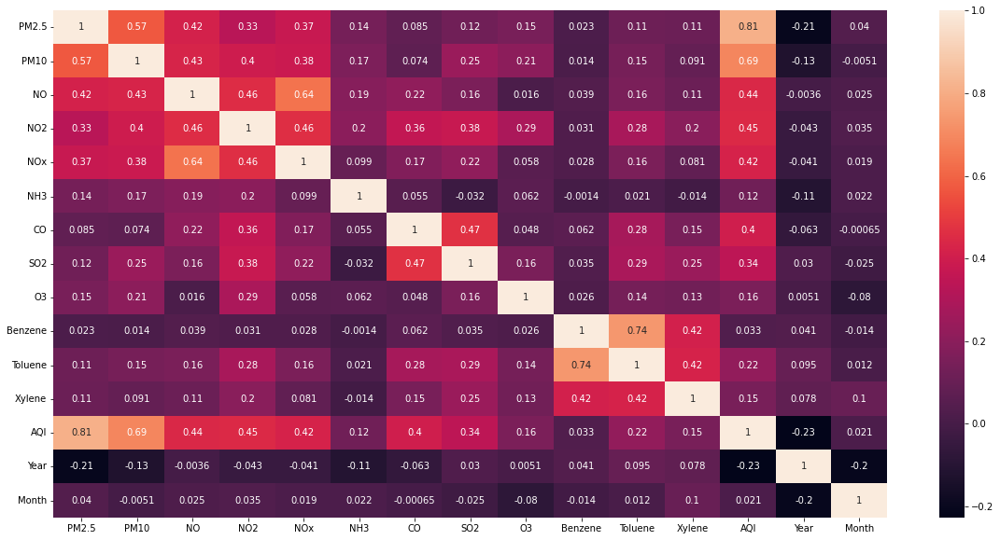

In [ ]:
#matplotlib.pyplot figure --> creates a new figure, or activates an already existing one
#figsize --> width and height in inches
#seaborn heatmap: data --> contains the data, annot --> shows the data value in each cell(correlation in this case)
plt.figure(figsize=(20,10))
sb.heatmap(df.corr(), annot = True)
plt.show()

In [ ]:
#create a list for all the variables whose correlation is to be plotted against the AQI
variables = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3']
#plot a scatter plot against each variable using plotly express
#dataframe, x --> a single value or a list of values for x axis, same for y
for variable in variables:
    fig = pex.scatter(df, x = 'AQI', y = variable, color='Year', title = 'Relation between {} and AQI'.format(variable))
    fig.show()

In [ ]:
city_wise = df.copy()
#to group the data by city and fill the median of each pollutant as the value
city_wise = city_wise.groupby(['City'])[['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'AQI']].median().reset_index()
#for all columns in the new dataframe, to round the value up to 2 decimal places
for col in city_wise.columns[1:]:
    city_wise[col] = round(city_wise[col],2)

In [ ]:
#creating a bar chart sorted in ascending order for each pollutant against every city
for col in city_wise.columns[1:]:
    fig = pex.bar(city_wise.sort_values(by=col,ascending=True),
                  x="City",y=col,color=col,text=col,title=col,
                 color_continuous_scale=["orange", "red",
                                         "green", "blue",
                                         "purple"])
    #to place the value of the median concentration outside the bar
    fig.update_traces(textposition='outside')
    fig.show()

In [ ]:
#create a new df which contains values first grouped by year, and then City, containing median values of AQI
newDf = df.groupby(['Year','City'])['AQI'].median().reset_index()

In [ ]:
#plot a histogram for all the cities, year-wise, against the AQI
fig = pex.histogram(newDf, x = "City", y = "AQI", color = 'Year',
                    color_discrete_sequence=["red", "blue",
                 "orange", "green", "yellow", "purple"], barmode = 'group')
fig.show()

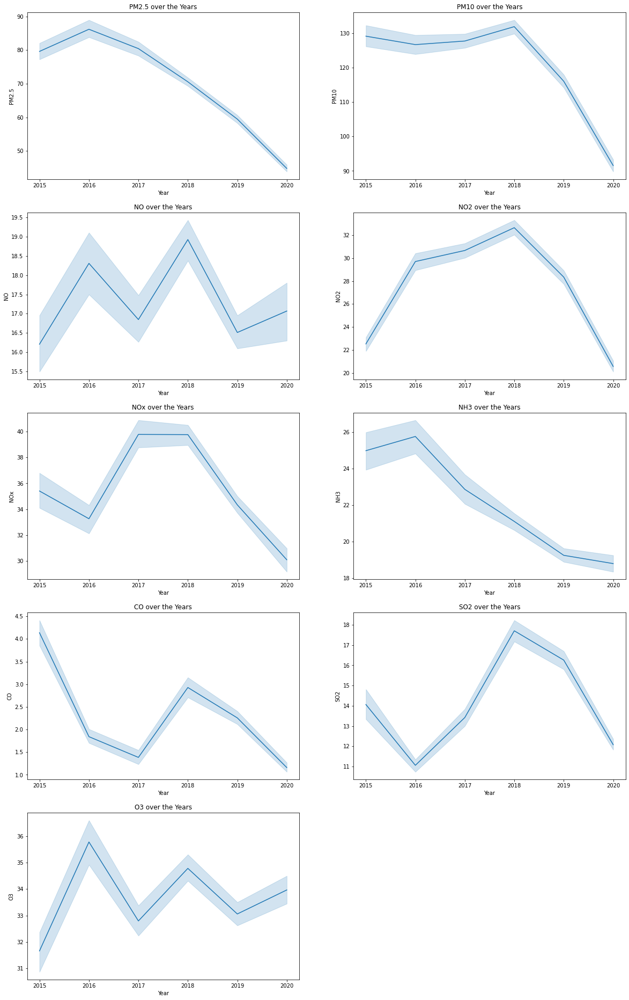

In [ ]:
#plotting subplots of line charts of all the pollutants over the years(a time series line plot), the shaded region: ci
#95% of the data is contained within the ci
fig=plt.figure(figsize=(20,40))
for i,col in enumerate(variables):
    fig.add_subplot(6,2,i+1)
    sb.lineplot(x='Year',y=col,data=df).set(title=col+' over the Years')

['Ahmedabad' 'Aizawl' 'Amaravati' 'Amritsar' 'Bengaluru' 'Bhopal'
 'Brajrajnagar' 'Chandigarh' 'Chennai' 'Coimbatore' 'Delhi' 'Ernakulam'
 'Gurugram' 'Guwahati' 'Hyderabad' 'Jaipur' 'Jorapokhar' 'Kochi' 'Kolkata'
 'Lucknow' 'Mumbai' 'Patna' 'Shillong' 'Talcher' 'Thiruvananthapuram'
 'Visakhapatnam']
Enter the city: Ahmedabad


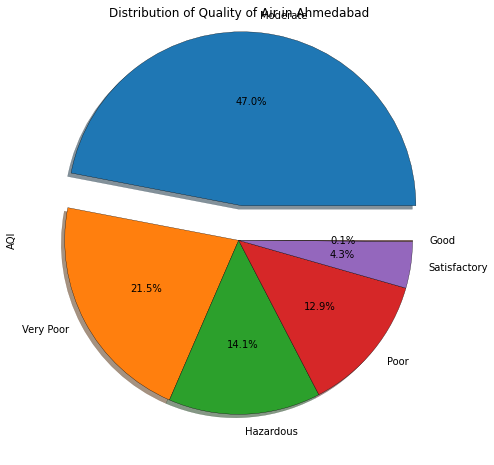

In [ ]:
#creating a function with user input, to enter city name and display a pie chart for the distribution of air quality(based on the AQI Scale)
def plotCityAQIScale(city):
    plt.figure(figsize=(10,8))
    cityData = df[df['City']==city]
    x= cityData.groupby(['AQI_Scale'])[["AQI"]].count().sort_values("AQI", ascending=False)
    explode=[0.2]
    for i in range(len(cityData.AQI_Scale.unique())-1):
      explode.append(0)

    x['AQI'].plot.pie(shadow=True,autopct='%1.1f%%',
                       explode=explode,
                   wedgeprops={'edgecolor':'black','linewidth':0.3}
                   ).set(title = 'Distribution of Quality of Air in '+city)
    plt.show()
    
print(df['City'].unique())
plotCityAQIScale(input('Enter the city: '))

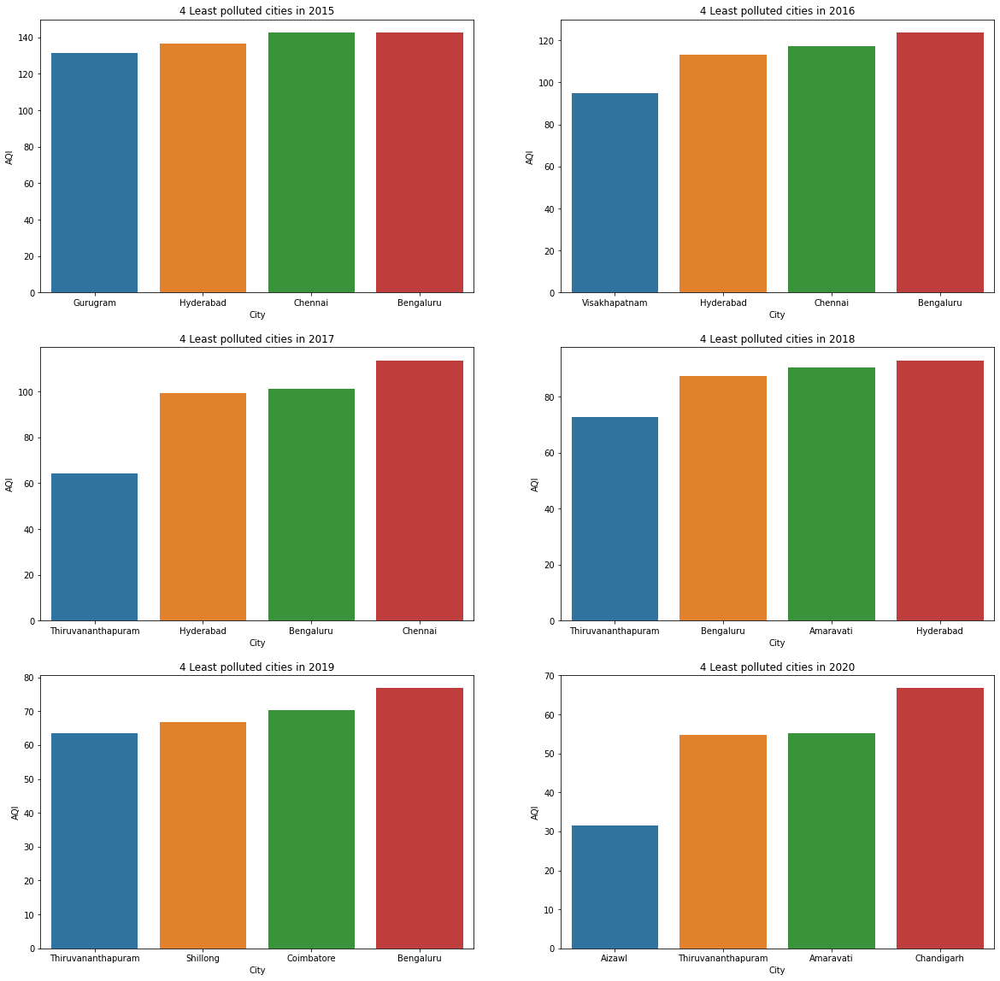

In [ ]:
#plotting the 4 least polluted cities year-wise
fig = plt.figure(figsize=(20,20))
for i, year in enumerate([2015,2016,2017,2018,2019,2020]):
  fig.add_subplot(3, 2, i+1)
  leastPolluted = df[df['Year']==year].groupby('City', as_index=False)[['AQI']].mean().sort_values(['AQI']).reset_index()
  leastPolluted = leastPolluted.head(4)
  sb.barplot(x = 'City', y = 'AQI', data = leastPolluted).set(title = '4 Least polluted cities in '+str(year))

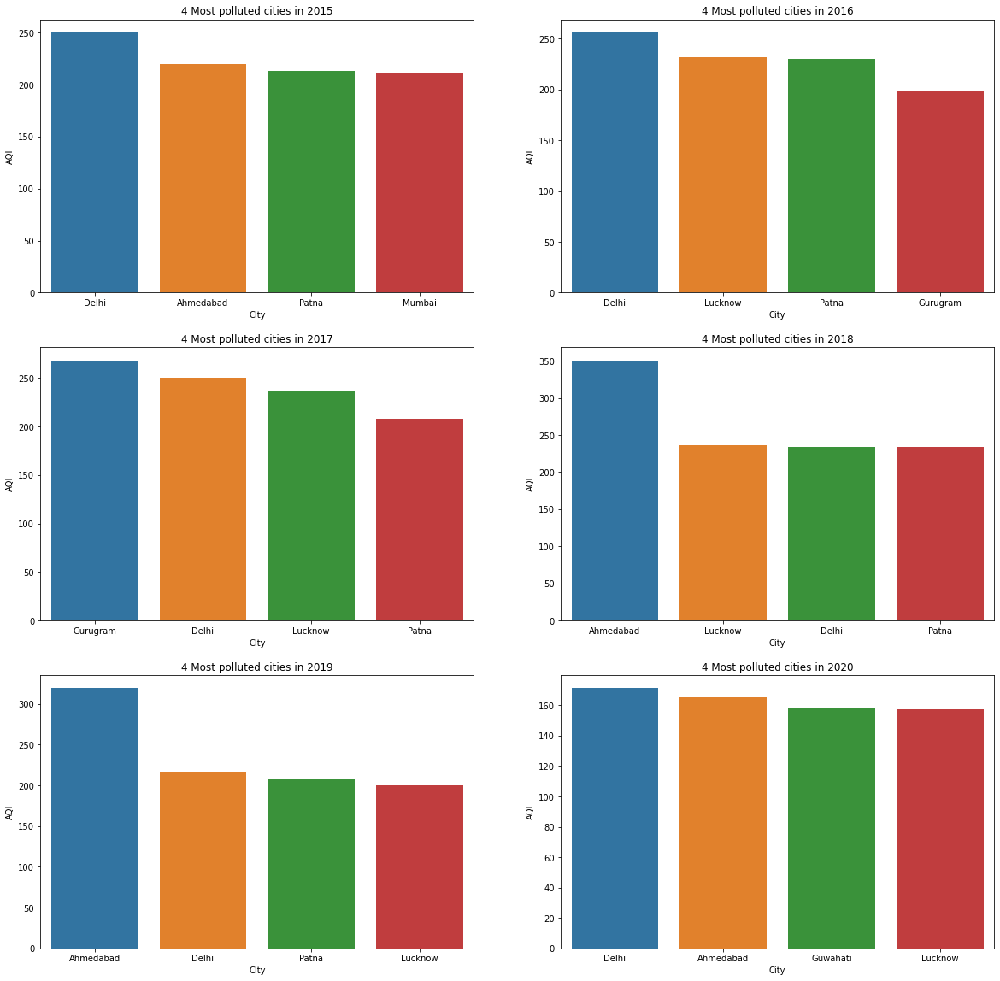

In [ ]:
#plotting the 4 most polluted cities year-wise
fig = plt.figure(figsize=(20,20))
for i, year in enumerate([2015,2016,2017,2018,2019,2020]):
  fig.add_subplot(3, 2, i+1)
  mostPolluted = df[df['Year']==year].groupby('City', as_index=False)[['AQI']].mean().sort_values(['AQI'], ascending = False).reset_index()
  mostPolluted = mostPolluted.head(4)
  sb.barplot(x = 'City', y = 'AQI', data = mostPolluted).set(title = '4 Most polluted cities in '+str(year))

In [ ]:
#Function to plot a histogram of aqi distribution for a given city, plots probability density on the Y axis
def histAQI(city):
  title = ''
  if city.lower() == 'all':
    data = df
  else:
    data = df[df['City']==city]
    title = 'for ' + city
  fig = pex.histogram(data_frame = data, x = 'AQI', nbins = 100,histnorm = 'probability density', title = 'Histogram of AQI Distribution '+title)
  fig.show()

In [ ]:
print(df['City'].unique())
histAQI(input("Enter city name or 'All' for every city: "))

['Ahmedabad' 'Aizawl' 'Amaravati' 'Amritsar' 'Bengaluru' 'Bhopal'
 'Brajrajnagar' 'Chandigarh' 'Chennai' 'Coimbatore' 'Delhi' 'Ernakulam'
 'Gurugram' 'Guwahati' 'Hyderabad' 'Jaipur' 'Jorapokhar' 'Kochi' 'Kolkata'
 'Lucknow' 'Mumbai' 'Patna' 'Shillong' 'Talcher' 'Thiruvananthapuram'
 'Visakhapatnam']
Enter city name or 'All' for every city: Chandigarh


In [ ]:
#Function to plot a line chart of aqi for a given city annually
def PollutantsLineOverYears(city, poll = 'AQI'):
  title = ''
  if city.lower() == 'all':
    data = df
  else:
    data = df[df['City']==city]
    title = city
  city = data.groupby(['Year','Month'], as_index=False)[[poll]].mean().reset_index()
  fig = pex.line(data_frame = city, x = 'Month', y = poll, color = 'Year', title = poll+' Distribution over Years: '+title)
  fig.show()

In [ ]:
city = input("Enter city name or 'All' for every city: ")
PollutantsLineOverYears(city)

Enter city name or 'All' for every city: All


In [ ]:
#Function to plot a line chart of a pollutant for a given city annually
city = input("Enter city name or 'All' for every city: ")
pollutant = input("Enter the pollutant: ")
PollutantsLineOverYears(city, poll = pollutant)

Enter city name or 'All' for every city: Hyderabad
Enter the pollutant: NO2


In [ ]:
# A function to plot the line chart of aqi
def cityColTrend(city, col):
    data = df[df['City'] == city]
    fig = pex.line(data_frame = data, x = 'Datetime', y = col, title = col + ": " + city)
    fig.show()

In [ ]:
cityColTrend('Delhi', 'AQI')

In [ ]:
df['Datetime'].max()

Timestamp('2020-07-01 00:00:00')

In [ ]:
#retrive the records of months between 2-7
new = df[(df['Month'] > 2) & (df['Month'] < 7)]
new

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Datetime,Year,Month,AQI_Scale
59,Ahmedabad,61.12,129.8545,3.58,16.81,20.92,16.9805,3.58,28.44,30.48,2.69,1.58,1.32,120.171782,2015-03-01,2015,3,Moderate
60,Ahmedabad,60.78,116.6685,9.07,18.21,27.34,19.7205,9.07,29.48,34.75,2.05,0.55,0.22,188.345570,2015-03-02,2015,3,Moderate
61,Ahmedabad,91.83,188.7555,12.99,28.71,40.76,16.8950,12.99,39.71,38.46,2.69,1.74,2.25,242.465217,2015-03-03,2015,3,Poor
62,Ahmedabad,93.88,164.5790,18.21,29.38,47.01,13.4490,18.21,62.75,46.79,5.21,2.55,1.55,307.502367,2015-03-04,2015,3,Very Poor
63,Ahmedabad,173.01,348.0810,48.44,42.27,90.73,14.6125,48.44,78.76,59.39,9.72,9.96,4.13,422.542640,2015-03-05,2015,3,Hazardous
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29525,Visakhapatnam,7.63,32.2700,5.91,23.27,17.19,11.1500,0.46,6.87,19.90,1.45,5.37,1.45,32.270000,2020-06-26,2020,6,Good
29526,Visakhapatnam,15.02,50.9400,7.68,25.06,19.54,12.4700,0.47,8.55,23.30,2.24,12.07,0.73,50.940000,2020-06-27,2020,6,Satisfactory
29527,Visakhapatnam,24.38,74.0900,3.42,26.06,16.53,11.9900,0.52,12.72,30.14,0.74,2.21,0.38,74.090000,2020-06-28,2020,6,Satisfactory
29528,Visakhapatnam,22.91,65.7300,3.45,29.53,18.33,10.7100,0.48,8.42,30.96,0.01,0.01,0.00,65.730000,2020-06-29,2020,6,Satisfactory


In [ ]:
#group the mean of data by Year and month 
cols = ['PM2.5', 'PM10', 'NO2', 'NH3', 'CO', 'SO2', 'O3', 'AQI']
groupedData = new.groupby(['Year', 'Month'])[cols].mean().reset_index()
groupedData.head()

,Year,Month,PM2.5,PM10,NO2,NH3,CO,SO2,O3,AQI
0,2015,3,87.583548,137.422782,23.364944,18.706217,6.274601,18.300220,36.842624,207.954081
1,2015,4,70.363497,132.321642,22.437944,17.440986,3.635735,17.293546,37.529862,175.746460
2,2015,5,63.713475,140.164247,24.410267,21.573479,4.200415,16.022892,36.799166,169.444637
3,2015,6,61.115246,108.367560,19.541546,23.207013,2.652390,9.542544,30.320044,152.997711
4,2016,3,91.659228,132.559549,27.051677,27.907005,1.297186,10.041982,42.075528,176.110163


In [ ]:
#plot a line chart of mean of pollutants against time 
for col in cols:
    fig = pex.line(data_frame = groupedData, x = 'Month', y = col, color = 'Year', title = col)
    fig.show()

#**Prediction**

In [ ]:
#Function to predict the AQI using moving average
def MovingNAverage(rows, df):
    df['MovingNAverage'] = 0
    for i in range(rows, len(df)):
        for n in range(1, rows+1):
            df.loc[i, 'MovingNAverage'] += df.loc[i-n, 'AQI']
    df.loc[:, 'MovingNAverage'] /= rows
    df.loc[:rows-1, 'MovingNAverage'] = np.nan

For an example, here we will be predicting the AQI of Delhi and comparing it with the actual AQI

In [ ]:
#Fetching data of delhi
delhi = df[df['City'] == 'Delhi'].reset_index()

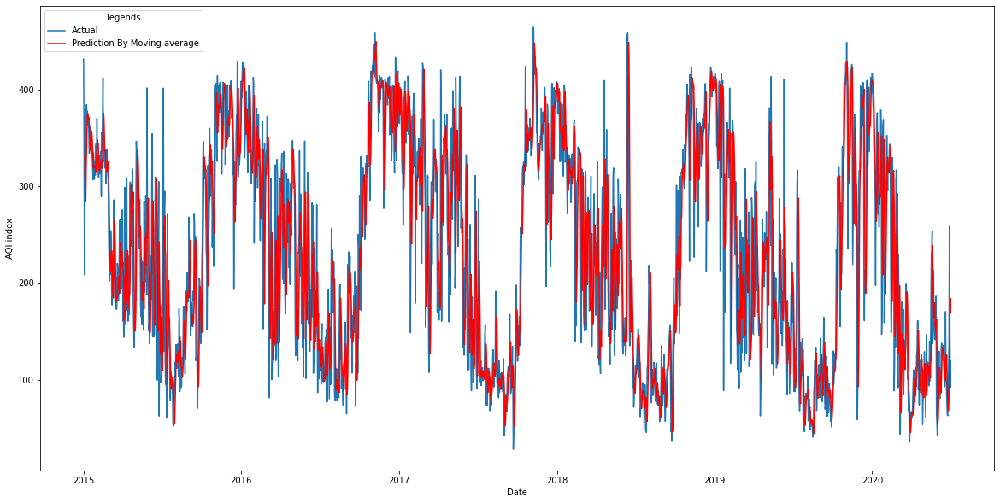

In [ ]:
MovingNAverage(3, delhi)

plt.figure(figsize = (20,10))
sb.lineplot(delhi.Datetime, delhi.AQI)

plot = sb.lineplot(delhi.Datetime,
             delhi.MovingNAverage, 
              color = 'red')

plot.legend(title='legends', loc='upper left',
           labels=['Actual', 'Prediction By Moving average'])

plot.set_ylabel('AQI index');
plot.set_xlabel('Date');